<span style='line-height:1.5;font-size: 17px;font-family:"Times New Roman"'>


<b><center><font size="6">M2 MASERATI </font></center></b>
<b><center><font size="6"> L'impact des taxes sur l'immobilier </font></center></b>    

    
<g><h7><center> KAFFAF Hicham   </center></h7></g>




<b><center><font size="5">M2 - 2024-2025</font></center></b>



</span>

# Objectif de l'étude

L'objectif de cette étude est de **prédire la valeur foncière** des propriétés en fonction de plusieurs variables explicatives, notamment des taxes et des caractéristiques physiques des biens. L'analyse porte sur les départements de la France et se concentre principalement sur l'impact des taxes locales sur la valeur foncière.

Les variables considérées dans cette étude incluent :

- **CFE_moyen** : Cotisation Foncière des Entreprises (CFE), qui est une taxe sur les biens immobiliers utilisés par les entreprises.
- **IFER_moyen** : Imposition Forfaitaire sur les Entreprises de Réseaux (IFER), une taxe appliquée aux entreprises exploitant des infrastructures de réseau.
- **TFPNB_moyen** : Taxe Foncière sur les Propriétés Non Bâties, qui s'applique aux terrains non construits.
- **Taxe_habit_moyen** : Taxe d'habitation, une taxe locale appliquée aux occupants de logements.
- **surface_reelle_bati** : Surface réelle du bâtiment.
- **nombre_pieces_principales** : Nombre de pièces principales dans le bâtiment.
- **nombre_lots** : Nombre de lots associés à la propriété.

L'étude vise à quantifier l'influence de ces variables sur la **valeur foncière** des propriétés, avec un accent particulier sur l'impact des taxes locales dans les différents départements de la France.


# Importation des packages

In [2]:
import requests
import io
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import folium
import seaborn as sns
import math
from IPython.display import display
import numpy as np
#
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
import statsmodels.api as sm
##
from xgboost import XGBRegressor
from sklearn.metrics import r2_score
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import RandomizedSearchCV

In [ ]:
# URL du fichier CSV compressé
url = 'https://files.data.gouv.fr/geo-dvf/latest/csv/2023/full.csv.gz'

# Télécharger le fichier
response = requests.get(url)
response.raise_for_status()  # Vérifie si le téléchargement a réussi

# Charger le fichier CSV compressé dans un DataFrame
data = pd.read_csv(io.BytesIO(response.content), compression='gzip', delimiter=',', low_memory=False) 

In [4]:
# Données des valeurs foncières
#data = pd.read_csv("C:/Users/kaffa/Videos/Projet Scoring/full.csv",delimiter=",",low_memory=False)
# Données des taxes
taxes = pd.read_excel("C:/Users/kaffa/Videos/Projet Scoring/taxes_dep.xlsx")
data.head()

,id_mutation,date_mutation,numero_disposition,nature_mutation,valeur_fonciere,adresse_numero,adresse_suffixe,adresse_nom_voie,adresse_code_voie,code_postal,...,type_local,surface_reelle_bati,nombre_pieces_principales,code_nature_culture,nature_culture,code_nature_culture_speciale,nature_culture_speciale,surface_terrain,longitude,latitude
0,2023-1,2023-01-05,1,Vente,1070000.0,184.0,NaN,ALL DES HETRES,0124,1630.0,...,Dépendance,NaN,0.0,NaN,NaN,NaN,NaN,NaN,6.019949,46.247458
1,2023-1,2023-01-05,1,Vente,1070000.0,159.0,NaN,ALL DES HETRES,0124,1630.0,...,Dépendance,NaN,0.0,NaN,NaN,NaN,NaN,NaN,6.020204,46.247228
2,2023-1,2023-01-05,1,Vente,1070000.0,159.0,NaN,ALL DES HETRES,0124,1630.0,...,Appartement,233.0,8.0,NaN,NaN,NaN,NaN,NaN,6.020204,46.247228
3,2023-2,2023-01-03,1,Vente,152200.0,2914.0,NaN,RTE DE PONCIN,0107,1450.0,...,Maison,64.0,3.0,S,sols,NaN,NaN,988.0,5.438273,46.129859
4,2023-3,2023-01-05,1,Vente,269000.0,427.0,T,CHE DE L'AUBEPIN,0040,1800.0,...,Maison,73.0,3.0,S,sols,NaN,NaN,835.0,5.225844,45.853513


# Data Preprocessing

In [8]:
colonnes_a_conserver = [
    "nature_mutation", "valeur_fonciere", "code_postal", "code_commune", "nom_commune", "code_departement",
    "type_local", "surface_reelle_bati", "nombre_pieces_principales", "surface_terrain", "longitude", "latitude",
    "lot1_numero", "lot1_surface_carrez", "lot2_numero", "lot2_surface_carrez", "lot3_numero", "lot3_surface_carrez",
    "lot4_numero", "lot4_surface_carrez", "lot5_numero", "lot5_surface_carrez", "nombre_lots"
]
data = data[colonnes_a_conserver]
data = data.dropna(subset=['surface_reelle_bati'])

###################################
# Pour réduire la taille de la base de donnéesn j'ai decidé de concentré mon étude sur les appartements et les maisons
###################################

data = data[((data['type_local'] == "Appartement") | (data['type_local'] == "Maison")) & (data['nature_mutation'] == "Vente")]

###################################
# On crée la variable région à partir d'un fichier qui va m'aider à faire le mapping
reg = pd.read_excel("C:/Users/kaffa/Videos/Projet Scoring/departements_régions.xlsx")
mapping = dict(zip(reg['code_departement'], reg['nom_region']))
# Ajouter une nouvelle colonne 'region'
data['region'] = data['code_departement'].map(mapping)
###################################

###################################
# Ajouter les variables taxes en faisant un merge entre les deux bases
data = pd.merge(data, taxes[['code_departement', 'CFE_moyen', 'IFER_moyen', 'TFPNB_moyen', 'Taxe_habit_moyen']],
                on='code_departement',
                how='left')
###################################

## Valeurs manquantes

On abondonne pour notre modélisation toutes les variables avec des valeurs manquantes.

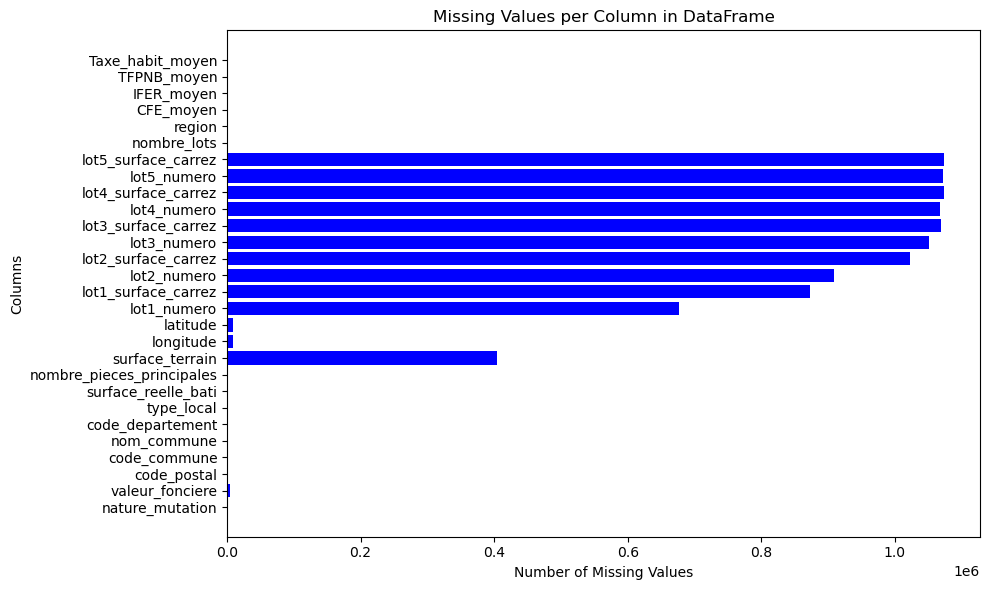

In [10]:
missing_values_report = data.isna().sum()
#
missing_values_report_df = missing_values_report.reset_index()
missing_values_report_df.columns = ['Column', 'Missing Values']
#
plt.figure(figsize=(10, 6))
plt.barh(missing_values_report_df['Column'], missing_values_report_df['Missing Values'], color='blue')
plt.xlabel('Number of Missing Values')
plt.ylabel('Columns')
plt.title('Missing Values per Column in DataFrame')
plt.tight_layout()
plt.show()

In [12]:
data = data.dropna(subset=['valeur_fonciere', 'latitude', 'longitude'])
data.shape

(1061254, 28)

# Talbe de corrélation

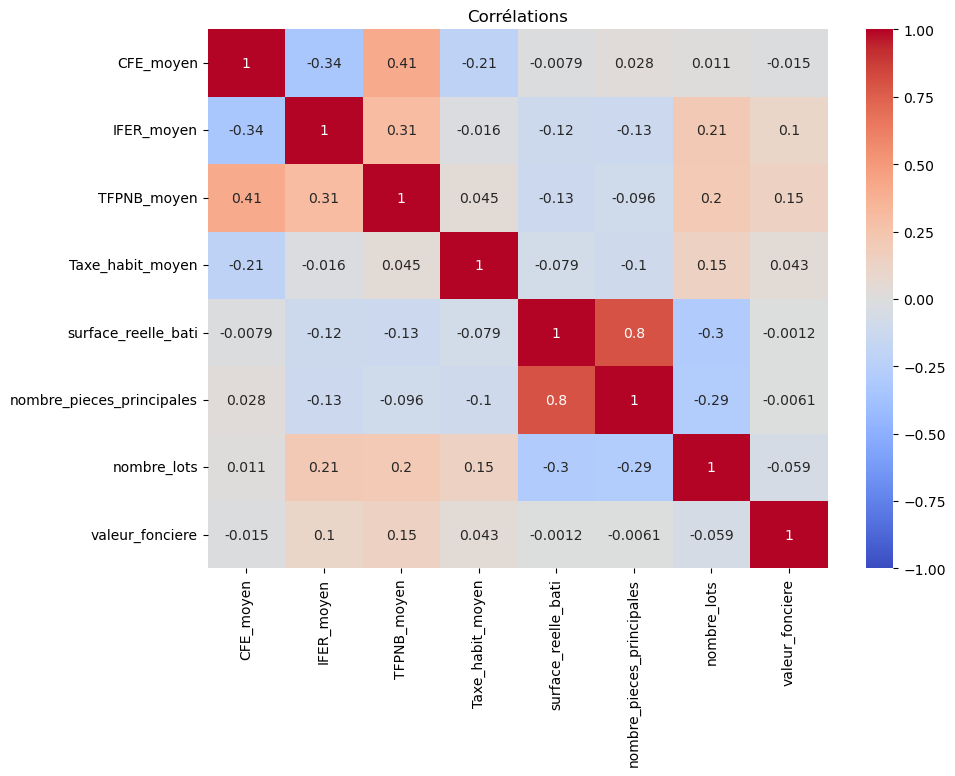

In [14]:
columns_of_interest = ['CFE_moyen',
                        'IFER_moyen',
                        'TFPNB_moyen',
                        'Taxe_habit_moyen',
                        'surface_reelle_bati',
                        'nombre_pieces_principales',
                        'nombre_lots',
                        'valeur_fonciere']

correlation_matrix = data[columns_of_interest].corr()

plt.figure(figsize=(10, 7))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Corrélations')
#plt.savefig('correlation_matrix.png')
plt.show()

# Nuage de points

## Analyse des relations entre les variables explicatives et la variable d'intérêt

Les nuages de points entre les différentes variables explicatives (telles que `CFE_moyen`, `IFER_moyen`, `TFPNB_moyen`, `Taxe_habit_moyen`, `surface_reelle_bati`, `nombre_pieces_principales`, `nombre_lots`) et la variable d'intérêt `valeur_fonciere` montrent que les relations ne sont pas strictement linéaires.

En conséquence, si nous devions appliquer une régression linéaire classique à ces données, il est probable que le **R²**. Ainsi, des modèles de **machine learning** (ML) tels que les **forêts aléatoires**, le **boosting** seraient plus adaptés pour ce type de données. Ces modèles peuvent mieux capturer la complexité et les interactions entre les variables, améliorant ainsi la performance de la prédiction.


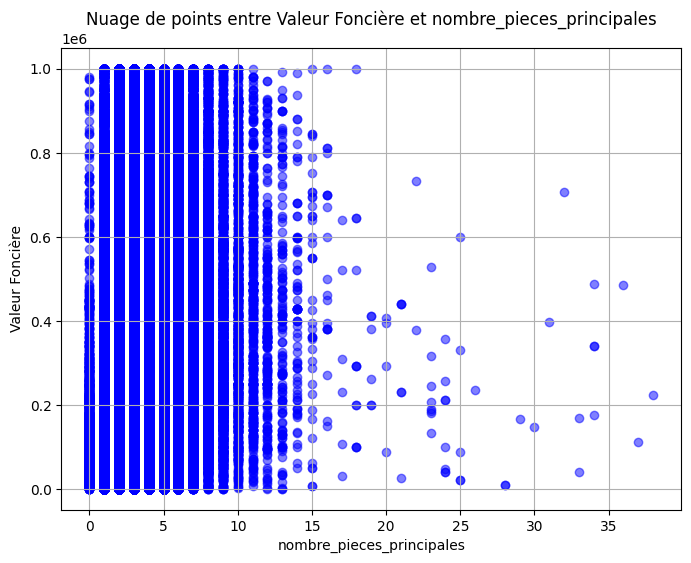

In [ ]:
data_filtre = data[(data['valeur_fonciere'] <= 1e6) & (data['nombre_pieces_principales'] <= 40)]

# Créer le nuage de points entre 'nombre_lots' et 'valeur_fonciere' filtré
plt.figure(figsize=(8,6))
plt.scatter(data_filtre['nombre_pieces_principales'], data_filtre['valeur_fonciere'], alpha=0.5, color='b')

# Ajouter des étiquettes aux axes et un titre
plt.xlabel('nombre_pieces_principales')
plt.ylabel('Valeur Foncière')
plt.title('Nuage de points entre Valeur Foncière et nombre_pieces_principales')

# Afficher la grille pour mieux visualiser les points
plt.grid(True)

# Afficher le graphique
plt.show()


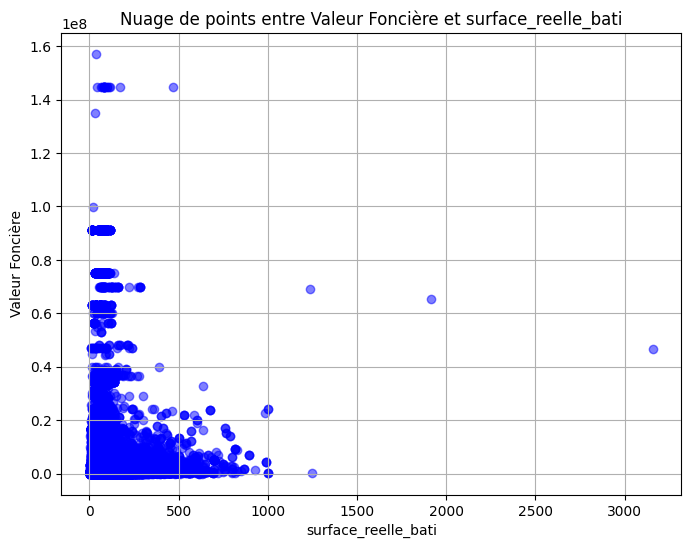

In [ ]:
plt.figure(figsize=(8,6))
plt.scatter(data['surface_reelle_bati'], data['valeur_fonciere'], alpha=0.5, color='b')

# Ajouter des étiquettes aux axes et un titre
plt.xlabel('surface_reelle_bati')
plt.ylabel('Valeur Foncière')
plt.title('Nuage de points entre Valeur Foncière et surface_reelle_bati')

# Afficher la grille pour mieux visualiser les points
plt.grid(True)

# Afficher le graphique
plt.show()

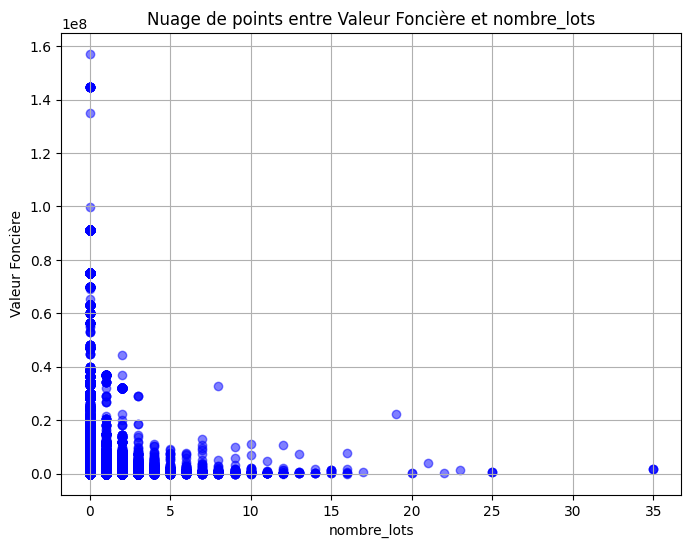

In [ ]:
plt.figure(figsize=(8,6))
plt.scatter(data['nombre_lots'], data['valeur_fonciere'], alpha=0.5, color='b')

# Ajouter des étiquettes aux axes et un titre
plt.xlabel('nombre_lots')
plt.ylabel('Valeur Foncière')
plt.title('Nuage de points entre Valeur Foncière et nombre_lots')

# Afficher la grille pour mieux visualiser les points
plt.grid(True)

# Afficher le graphique
plt.show()

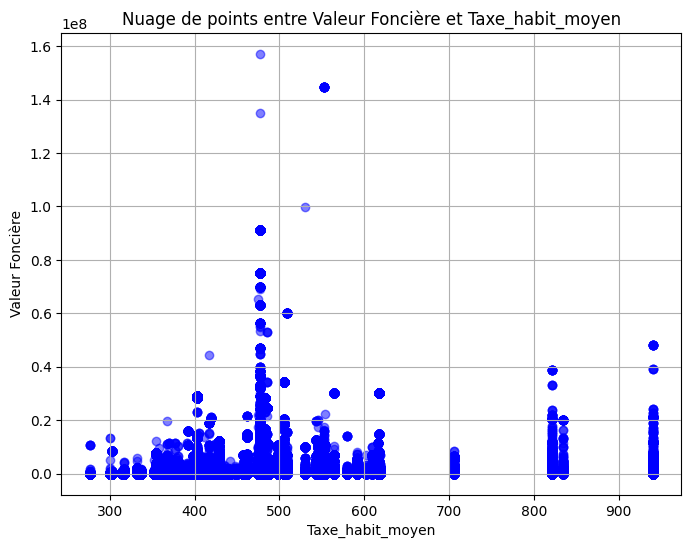

In [ ]:
plt.figure(figsize=(8,6))
plt.scatter(data['Taxe_habit_moyen'], data['valeur_fonciere'], alpha=0.5, color='b')

# Ajouter des étiquettes aux axes et un titre
plt.xlabel('Taxe_habit_moyen')
plt.ylabel('Valeur Foncière')
plt.title('Nuage de points entre Valeur Foncière et Taxe_habit_moyen')

# Afficher la grille pour mieux visualiser les points
plt.grid(True)

# Afficher le graphique
plt.show()

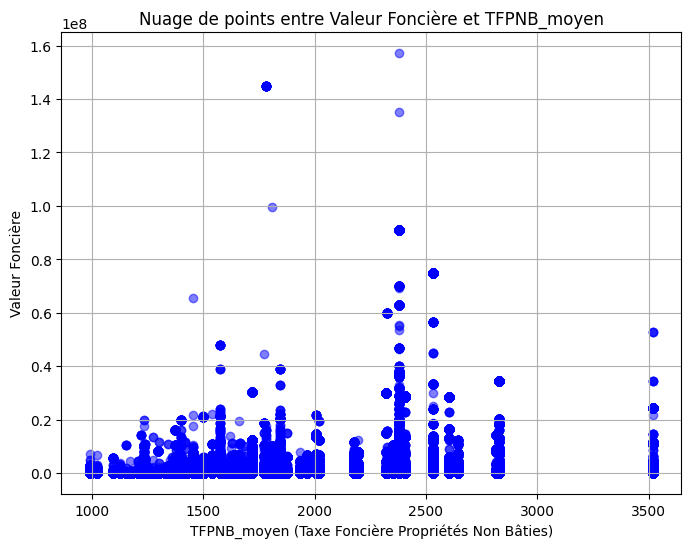

In [ ]:
plt.figure(figsize=(8,6))
plt.scatter(data['TFPNB_moyen'], data['valeur_fonciere'], alpha=0.5, color='b')

# Ajouter des étiquettes aux axes et un titre
plt.xlabel('TFPNB_moyen (Taxe Foncière Propriétés Non Bâties)')
plt.ylabel('Valeur Foncière')
plt.title('Nuage de points entre Valeur Foncière et TFPNB_moyen')

# Afficher la grille pour mieux visualiser les points
plt.grid(True)

# Afficher le graphique
plt.show()

## Detection des outliers

## Présence de valeurs aberrantes dans la base de données

L'analyse des box plots montre que la base de données contient plusieurs **valeurs aberrantes**. Par exemple, on peut parfois observer des propriétés dont la valeur atteint 30 millions d'euros dans de petites villes en province, ce qui représente des cas extrêmes.

Afin d'éviter que ces valeurs atypiques n'affectent la qualité des prédictions, j'ai décidé de **limiter** les valeurs qui dépassent le 95ème centile. Cela permet de réduire l'influence de ces outliers tout en conservant l'essentiel de la variation présente dans les données.


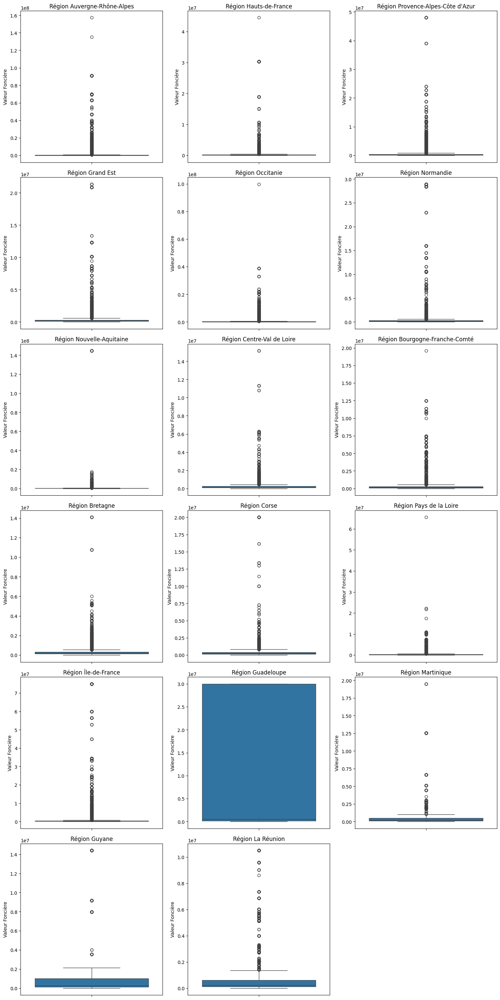

In [ ]:
# Get the unique regions
unique_regions = data['region'].unique()

# Set up for plotting 3 plots per row
plots_per_row = 3
num_regions = len(unique_regions)
num_rows = math.ceil(num_regions / plots_per_row)

# Create the subplots
fig, axes = plt.subplots(num_rows, plots_per_row, figsize=(15, num_rows * 5))

# Flatten the axes array in case of multiple rows
axes = axes.flatten()

# Loop through each region and plot individually
for i, region in enumerate(unique_regions):
    # Select data for the current region
    region_data = data[data['region'] == region]

    # Create the box plot in the corresponding subplot
    sns.boxplot(ax=axes[i], y='valeur_fonciere', data=region_data)

    # Set the title as the region name
    axes[i].set_title(f'Région {region}')
    axes[i].set_ylabel('Valeur Foncière')

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])
plt.tight_layout()
plt.show()

### Mettre un CAP sur les valeurs foncières (90ème quartile)

On remarque qu'il existe des valeurs extrêmes. Je vais chercher à "capper" la variable valeurs foncière au q95

In [20]:
summary_table = data.groupby('code_departement').agg(
    min_valeur_fonciere=('valeur_fonciere', 'min'),
    max_valeur_fonciere=('valeur_fonciere', 'max'),
    q90_valeur_fonciere=('valeur_fonciere', lambda x: x.quantile(0.90)),
    q95_valeur_fonciere=('valeur_fonciere', lambda x: x.quantile(0.95)),
    count_above_q90=('valeur_fonciere', lambda x: (x > x.quantile(0.90)).sum()),
    count_above_q95=('valeur_fonciere', lambda x: (x > x.quantile(0.95)).sum())
).reset_index()

summary_table.head()

,code_departement,min_valeur_fonciere,max_valeur_fonciere,q90_valeur_fonciere,q95_valeur_fonciere,count_above_q90,count_above_q95
0,01,1.0,5300000.0,560000.0,730000.0,907,451
1,02,1.0,8230000.0,257000.0,340000.0,790,393
2,03,1.0,4673000.0,286352.5,390592.5,800,400
3,04,1.0,3390000.0,398931.0,510470.0,396,198
4,05,1.0,2806951.0,414750.0,591000.0,376,188


In [24]:
# Fusionner le DataFrame 'data' avec 'summary_table' pour obtenir les quantiles
data = data.merge(summary_table[['code_departement', 'q95_valeur_fonciere']], on='code_departement', how='left')

# Créer la variable 'valeur_95q' en capant les valeurs au 95ème quantile
data['valeur_95q'] = data['valeur_fonciere'].where(data['valeur_fonciere'] <= data['q95_valeur_fonciere'], data['q95_valeur_fonciere'])

# Afficher le DataFrame avec la nouvelle variable
print(data[['valeur_fonciere', 'valeur_95q']])

         valeur_fonciere  valeur_95q
0              1070000.0    730000.0
1               152200.0    152200.0
2               269000.0    269000.0
3               770000.0    730000.0
4                85520.0     85520.0
...                  ...         ...
1061249         290000.0    290000.0
1061250         303000.0    303000.0
1061251         258070.0    258070.0
1061252         258070.0    258070.0
1061253          98250.0     98250.0

[1061254 rows x 2 columns]


# Représentation sur carte

In [26]:
# Étape 1 : Calculer la valeur foncière moyenne par région
valeur_fonciere_moyenne = data.groupby("region")["valeur_fonciere"].mean().reset_index()

# Ajouter une colonne formatée pour l'affichage (garder la version numérique pour le calcul)
valeur_fonciere_moyenne["valeur_fonciere_formatee"] = valeur_fonciere_moyenne["valeur_fonciere"].apply(lambda x: f"{int(x):,}".replace(",", " "))

# Étape 2 : Charger les géométries des régions de France avec GeoPandas
url_geojson = 'https://raw.githubusercontent.com/gregoiredavid/france-geojson/master/regions.geojson'
regions_geo = gpd.read_file(url_geojson)

# Étape 3 : Fusionner les données géographiques avec la moyenne de la valeur foncière
regions_geo = regions_geo.merge(valeur_fonciere_moyenne, how="left", left_on="nom", right_on="region")

# Étape 4 : Créer la carte interactive
m = folium.Map(location=[46.603354, 1.888334], zoom_start=6)  # Centré sur la France

# Ajouter les régions avec des couleurs en fonction de la valeur foncière moyenne (numérique)
folium.Choropleth(
    geo_data=regions_geo,
    name="choropleth",
    data=regions_geo,
    columns=["region", "valeur_fonciere"],  # Utilisation de la valeur numérique
    key_on="feature.properties.nom",
    fill_color="YlOrRd",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Valeur foncière moyenne par région (€)",
).add_to(m)

# Ajouter des étiquettes pour chaque région avec le format modifié
for _, row in regions_geo.iterrows():
    # Utiliser la valeur formatée pour l'affichage dans le popup
    folium.Marker(
        [row["geometry"].centroid.y, row["geometry"].centroid.x],
        popup=f"{row['region']}: {row['valeur_fonciere_formatee']} €",
    ).add_to(m)

# Afficher la carte dans le notebook Jupyter
display(m)

In [ ]:
# Étape 1 : Ajouter une colonne "prix_m2" pour le prix par m²
data["prix_m2"] = data["valeur_fonciere"] / data["surface_reelle_bati"]

# Étape 2 : Calculer le prix médian par m² par département
prix_m2_median_par_departement = data.groupby("code_departement")["prix_m2"].median().reset_index()

# Ajouter la colonne "nom_departement" pour une meilleure lisibilité (fusion avec nom de la première commune du département)
prix_m2_median_par_departement = prix_m2_median_par_departement.merge(
    data[["code_departement", "nom_commune"]].drop_duplicates(subset=["code_departement"]),
    on="code_departement",
    how="left",
)

# Étape 3 : Charger les géométries des départements français avec GeoPandas
url_geojson_departements = 'https://raw.githubusercontent.com/gregoiredavid/france-geojson/master/departements.geojson'
departements_geo = gpd.read_file(url_geojson_departements)

# Étape 4 : Fusionner les données géographiques avec le prix médian par m² par département
departements_geo = departements_geo.merge(prix_m2_median_par_departement, how="left", left_on="code", right_on="code_departement")

# Étape 5 : Créer la carte interactive
m = folium.Map(location=[46.603354, 1.888334], zoom_start=6)  # Centré sur la France

# Ajouter les départements avec des couleurs en fonction du prix médian par m²
folium.Choropleth(
    geo_data=departements_geo,
    name="choropleth",
    data=departements_geo,
    columns=["code_departement", "prix_m2"],  # Utilisation de la valeur numérique du prix au m²
    key_on="feature.properties.code",
    fill_color="YlOrRd",
    fill_opacity=0.7,
    line_opacity=0.2,
    nan_fill_color="white",
    legend_name="Prix médian au m² par département (€)",
).add_to(m)

for _, row in departements_geo.iterrows():
    if not pd.isna(row["prix_m2"]):
        prix_format = f"{int(row['prix_m2']):,}".replace(",", " ")  # Formatage du prix avec séparateur de milliers
        folium.Marker(
            [row["geometry"].centroid.y, row["geometry"].centroid.x],
            popup=f"Département {row['nom']}: {prix_format} €/m²",
        ).add_to(m)
display(m)

In [ ]:
# Step 1: Ensure Taxe_habit_moyen exists for each department
taxe_habit_par_departement = data.groupby("code_departement")["Taxe_habit_moyen"].mean().reset_index()

# Add department names for readability (merge with the first commune name in each department)
taxe_habit_par_departement = taxe_habit_par_departement.merge(
    data[["code_departement", "nom_commune"]].drop_duplicates(subset=["code_departement"]),
    on="code_departement",
    how="left",
)

# Step 2: Load the geometries of French departments using GeoPandas
url_geojson_departements = 'https://raw.githubusercontent.com/gregoiredavid/france-geojson/master/departements.geojson'
departements_geo = gpd.read_file(url_geojson_departements)

# Step 3: Merge geographic data with the Taxe_habit_moyen data by department
departements_geo = departements_geo.merge(taxe_habit_par_departement, how="left", left_on="code", right_on="code_departement")

# Step 4: Create the interactive map centered on France
m = folium.Map(location=[46.603354, 1.888334], zoom_start=6)  # Centered on France

# Add departments colored by average housing tax (Taxe_habit_moyen)
folium.Choropleth(
    geo_data=departements_geo,
    name="choropleth",
    data=departements_geo,
    columns=["code_departement", "Taxe_habit_moyen"],  # Using Taxe_habit_moyen for coloring
    key_on="feature.properties.code",
    fill_color="YlOrRd",
    fill_opacity=0.7,
    line_opacity=0.2,
    nan_fill_color="white",
    legend_name="Taxe d'Habitation Moyenne par Département (€)",
).add_to(m)

# Add markers with department name and average tax
for _, row in departements_geo.iterrows():
    if not pd.isna(row["Taxe_habit_moyen"]):
        taxe_format = f"{int(row['Taxe_habit_moyen']):,}".replace(",", " ")  # Format the tax with thousands separator
        folium.Marker(
            [row["geometry"].centroid.y, row["geometry"].centroid.x],
            popup=f"Département {row['nom']}: {taxe_format} €",
        ).add_to(m)

# Display the interactive map
display(m)

## Modélisation

Cette partie de l'étude est dédiée à la **modélisation** avec pour objectif de **prédire la valeur foncière** en fonction de plusieurs variables explicatives, notamment les taxes par département, le nombre de chambres, la surface en m², et d'autres caractéristiques des propriétés.

Pour cette modélisation, nous allons comparer la **régression linéaire** avec plusieurs modèles de **machine learning** tels que :
- **KNN** (K-Nearest Neighbors),
- **RF** (Random Forest),
- **GBR** (Gradient Boosting Regressor),
- **XGB** (XGBoost).

Ces modèles seront évalués et comparés en fonction de leur **R²**, afin d'identifier celui qui offre la meilleure performance de prédiction pour notre jeu d données.


In [ ]:
data.columns

Index(['nature_mutation', 'valeur_fonciere', 'code_postal', 'code_commune',
       'nom_commune', 'code_departement', 'type_local', 'surface_reelle_bati',
       'nombre_pieces_principales', 'surface_terrain', 'longitude', 'latitude',
       'lot1_numero', 'lot1_surface_carrez', 'lot2_numero',
       'lot2_surface_carrez', 'lot3_numero', 'lot3_surface_carrez',
       'lot4_numero', 'lot4_surface_carrez', 'lot5_numero',
       'lot5_surface_carrez', 'nombre_lots', 'region', 'CFE_moyen',
       'IFER_moyen', 'TFPNB_moyen', 'Taxe_habit_moyen'],
      dtype='object')

In [28]:
x = data[['CFE_moyen',
        'IFER_moyen',
        'TFPNB_moyen',
        'Taxe_habit_moyen',
        'surface_reelle_bati',
        'nombre_pieces_principales',
        'nombre_lots'
        ]]

y = data['valeur_fonciere']
y2 = data['valeur_95q']

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.25, random_state=77)

In [ ]:
lr  = LinearRegression()

knn = KNeighborsRegressor(n_neighbors=3)

rf  = RandomForestRegressor(n_estimators=230,max_depth= 44,min_samples_leaf = 45)

gbr = GradientBoostingRegressor(max_depth=3, n_estimators=220 , learning_rate =0.15)

xgb = XGBRegressor(max_depth = 16 , n_estimators= 20, learning_rate = 0.11)

regressors = [('Linear Regression', lr), ('K Nearest Neighbours', knn),
              ('Random Forest', rf),('Gradient Boosting Regressor', gbr),('XGBRegressor', xgb)]

# Modèles avec outliers

Linear Regression : 4 %
K Nearest Neighbours : 46 %
Random Forest : 47 %
Gradient Boosting Regressor : 34 %
XGBRegressor : 56 %


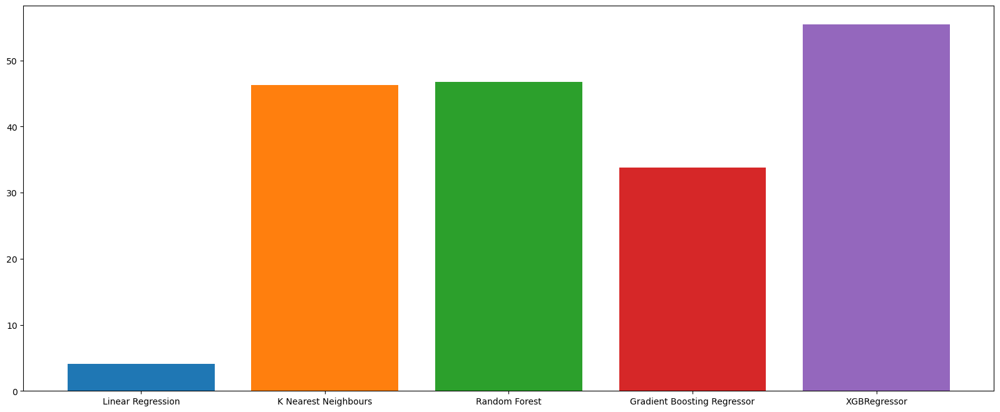

In [ ]:
for regressor_name, regressor in regressors:

    regressor.fit(x_train, y_train)

    y_pred = regressor.predict(x_test)
    accuracy = round(r2_score(y_test,y_pred),3)*100

    print('{:s} : {:.0f} %'.format(regressor_name, accuracy))
    plt.rcParams["figure.figsize"] = (20,8)
    plt.bar(regressor_name,accuracy)

# Modèles sans outliers

In [30]:
x_train, x_test, y_train, y_test = train_test_split(x, y2, test_size=0.25, random_state=77)

Linear Regression : 5 %
K Nearest Neighbours : 71 %
Random Forest : 69 %
Gradient Boosting Regressor : 58 %
XGBRegressor : 76 %


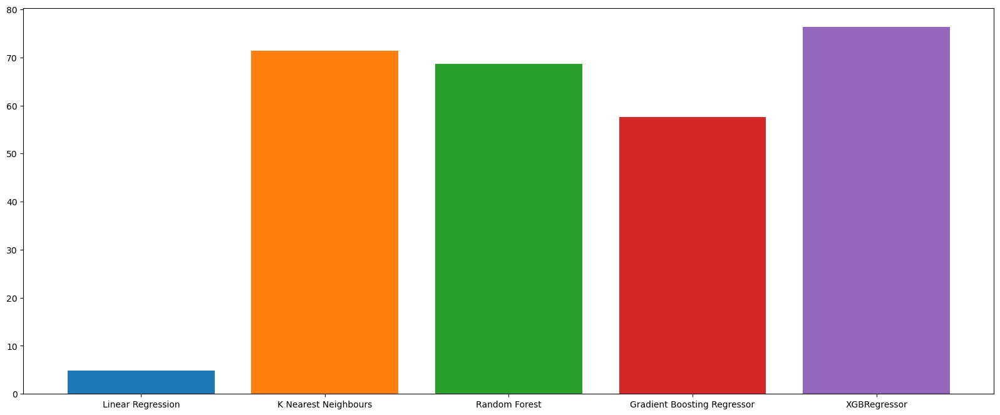

In [ ]:
for regressor_name, regressor in regressors:

    regressor.fit(x_train, y_train)

    y_pred = regressor.predict(x_test)
    accuracy = round(r2_score(y_test,y_pred),3)*100

    print('{:s} : {:.0f} %'.format(regressor_name, accuracy))
    plt.rcParams["figure.figsize"] = (20,8)
    plt.bar(regressor_name,accuracy)

## Optimisation des hyperparamètres

Pour améliorer les performances des modèles de machine learning, nous allons procéder à une **optimisation des hyperparamètres**. Les hyperparamètres sont des paramètres du modèle qui influencent son fonctionnement et sa capacité à généraliser sur de nouvelles données. Par exemple, dans un modèle de forêt aléatoire (Random Forest), le nombre d'arbres (estimators) et la profondeur maximale des arbres sont des hyperparamètres importants.

### Utilisation du Randomized Search de Scikit-Learn

Pour optimiser ces hyperparamètres, nous allons utiliser le **Randomized Search** de la bibliothèque **Scikit-Learn**. Contrairement à une recherche exhaustive (Grid Search) qui teste toutes les combinaisons possibles d'hyperparamètres, le **Randomized Search** explore aléatoirement un sous-ensemble de combinaisons. Cela permet de trouver de bons hyperparamètres tout en réduisant le temps de c le modèle.


In [ ]:
# KNeighborsRegressor
knn = KNeighborsRegressor()

# Définition de la grille d'hyperparamètres à tester
param_grid = {
    'n_neighbors': np.arange(1, 50),
    'weights': ['uniform', 'distance'],
    'metric': ['minkowski', 'euclidean', 'manhattan']
}

random_search = RandomizedSearchCV(
    estimator=knn,
    param_distributions=param_grid,
    n_iter=100,
    random_state=42,
    n_jobs=-1,
    verbose=0)

random_search.fit(x_train, y_train)

# Affichage du meilleur hyperparamètre et du score de validation croisée
print("Meilleurs paramètres trouvés :", random_search.best_params_)
print("Meilleur score de validation croisée :", random_search.best_score_)

# Évaluation sur x_test et y_test
best_model = random_search.best_estimator_
score_test = best_model.score(x_test, y_test)
print("Score sur l'échantillon test :", score_test)

Meilleurs paramètres trouvés : {'weights': 'distance', 'n_neighbors': 38, 'metric': 'minkowski'}
Meilleur score de validation croisée : 0.7501034965887319
Score sur l'échantillon test : 0.7671070826836487


In [ ]:
rf = RandomForestRegressor(random_state=42)

param_grid = {
    'n_estimators': np.arange(1, 300, 30),
    'max_depth': np.arange(1, 10),
    'min_samples_leaf': np.arange(1, 30, 2)
}


random_search = RandomizedSearchCV(
    estimator=rf,
    param_distributions=param_grid,
    n_iter=10,
    random_state=42,
    verbose=0,
    n_jobs=-1)

random_search.fit(x_train, y_train)

# Affichage du meilleur hyperparamètre et du score de validation croisée
print("Meilleurs paramètres trouvés :", random_search.best_params_)
print("Meilleur score de validation croisée :", random_search.best_score_)

# Évaluation sur x_test et y_test
best_model = random_search.best_estimator_
score_test = best_model.score(x_test, y_test)
print("Score sur l'échantillon test :", score_test)

Meilleurs paramètres trouvés : {'n_estimators': 241, 'min_samples_leaf': 7, 'max_depth': 9}
Meilleur score de validation croisée : 0.6394443568860317
Score sur l'échantillon test : 0.6522708576257523


In [ ]:
gb = GradientBoostingRegressor(random_state=42)


param_grid = {
    'max_depth': np.arange(1, 10, 2),
    'n_estimators': np.arange(1, 300, 40),
    'learning_rate': np.arange(0.01, 0.2, 0.05)
}

random_search = RandomizedSearchCV(
    estimator=gb,
    param_distributions=param_grid,
    n_iter=10,
    random_state=42,
    verbose=0, n_jobs=-1
)

random_search.fit(x_train, y_train)

# Affichage du meilleur hyperparamètre et du score de validation croisée
print("Meilleurs paramètres trouvés :", random_search.best_params_)
print("Meilleur score de validation croisée :", random_search.best_score_)

# Évaluation sur x_test et y_test
best_model = random_search.best_estimator_
score_test = best_model.score(x_test, y_test)
print("Score sur l'échantillon test :", score_test)

In [ ]:
xgb = XGBRegressor(random_state=42)


param_grid = {
    'max_depth': np.arange(1, 10),
    'n_estimators': np.arange(1, 300, 30),
    'learning_rate': np.arange(0.01, 0.2, 0.03)
}

random_search = RandomizedSearchCV(
    estimator=xgb,
    param_distributions=param_grid,
    n_iter=10,
    random_state=42,
    verbose=0, n_jobs=-1
    )

random_search.fit(x_train, y_train)

# Affichage du meilleur hyperparamètre et du score de validation croisée
print("Meilleurs paramètres trouvés :", random_search.best_params_)
print("Meilleur score de validation croisée :", random_search.best_score_)

# Évaluation sur x_test et y_test
best_model = random_search.best_estimator_
score_test = best_model.score(x_test, y_test)
print("Score sur l'échantillon test :", score_test)

Meilleurs paramètres trouvés : {'n_estimators': 151, 'max_depth': 7, 'learning_rate': 0.19}
Meilleur score de validation croisée : 0.7477827696498679
Score sur l'échantillon test : 0.7608608999700324


# Modéles optimisés

In [32]:
lr  = LinearRegression()

knn = KNeighborsRegressor(weights= 'distance',
                          n_neighbors= 38,
                          metric= 'minkowski')

rf  = RandomForestRegressor(n_estimators = 241,
                            min_samples_leaf= 7,
                            max_depth= 9)

gbr = GradientBoostingRegressor(max_depth=3,
                                n_estimators=220 ,
                                learning_rate =0.15)

xgb = XGBRegressor( n_estimators = 151,
                    max_depth= 7,
                    learning_rate= 0.19)

regressors = [('Linear Regression', lr), ('K Nearest Neighbours', knn),
              ('Random Forest', rf),('Gradient Boosting Regressor', gbr),
               ('XGBRegressor', xgb)]

Linear Regression : 5 %
K Nearest Neighbours : 77 %
Random Forest : 65 %
Gradient Boosting Regressor : 58 %
XGBRegressor : 76 %


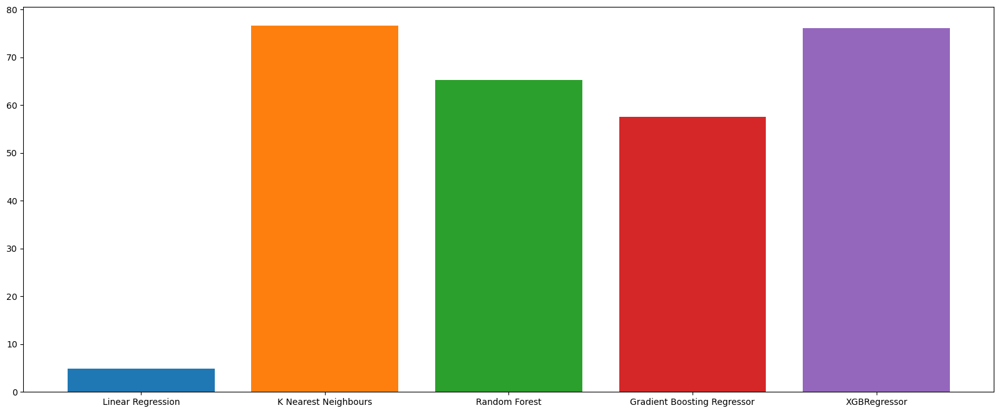

In [34]:
for regressor_name, regressor in regressors:

    regressor.fit(x_train, y_train)

    y_pred = regressor.predict(x_test)
    accuracy = round(r2_score(y_test,y_pred),3)*100

    print('{:s} : {:.0f} %'.format(regressor_name, accuracy))
    plt.rcParams["figure.figsize"] = (20,8)
    plt.bar(regressor_name,accuracy)

# Interprétation des résultats

## Partial Dependance Plot

### Qu'est-ce qu'un Dependence Plot ?

Un **dependence plot** (ou graphique de dépendance partielle) est une technique utilisée pour interpréter les modèles de machine learning, en particulier ceux qui sont considérés comme des **boîtes noires** (black box), comme les forêts aléatoires, les réseaux neuronaux ou les modèles de boosting. Ces modèles sont souvent difficiles à comprendre car ils génèrent des prédictions complexes à partir de nombreuses variables et interactions.
#
## Comment fonctionne un Dependence Plot ?

Le dependence plot permet de visualiser la relation entre une variable explicative (feature) spécifique et la sortie du modèle (prédiction), tout en **fixant les autres variables à leurs valeurs moyennes** ou en tenant compte de leurs distributions globales. Il montre ainsi l'impact direct de cette variable sur le résultat du mo du# modèle.

## Interprétation du Dependence Plot

- **Axes** :
  - L'axe des X représente les valeurs de la variable explicative choisie (par exemple, "surface_reelle_bati").
  - L'axe des Y représente les valeurs prédites par le modèle (la sortie du modèle).
  
- **Effet de la variable** :
  - Si la courbe monte, cela signifie que la variable a un effet **positif** sur la prédiction du modèle (plus la valeur de cette variable augmente, plus la prédiction augmente).
  - Si la courbe descend, cela signifie que la variable a un effet **négatif** sur la prédiction.
  
- **Interactions** :
  - Un dependence plot peut également montrer des **interactions** avec d'autres variables si on ajoute une deuxième dimension (second feature). Cela permet de mieux comprendre comment deux variables interagissent pour influencer e de pièces ou la localisation.

En résumé, un **dependence plot** est un outil d'interprétation puissant qui permet de mieux comprendre le comportement d'un modèle de machine learning en visualisant l'impact d'une variable explicative sur la sortie du modèle. Il aide à transformer une boîte noire en un modèle plus transparent et interprétable.


In [38]:
from sklearn.inspection import PartialDependenceDisplay

## Interprétation du graphique

Le graphique montre une relation positive entre la **taxe d'habitation** et le **prix des logements**. On observe que, de manière générale, à mesure que la taxe d'habitation augmente, le prix des logements tend également à augmenterés.


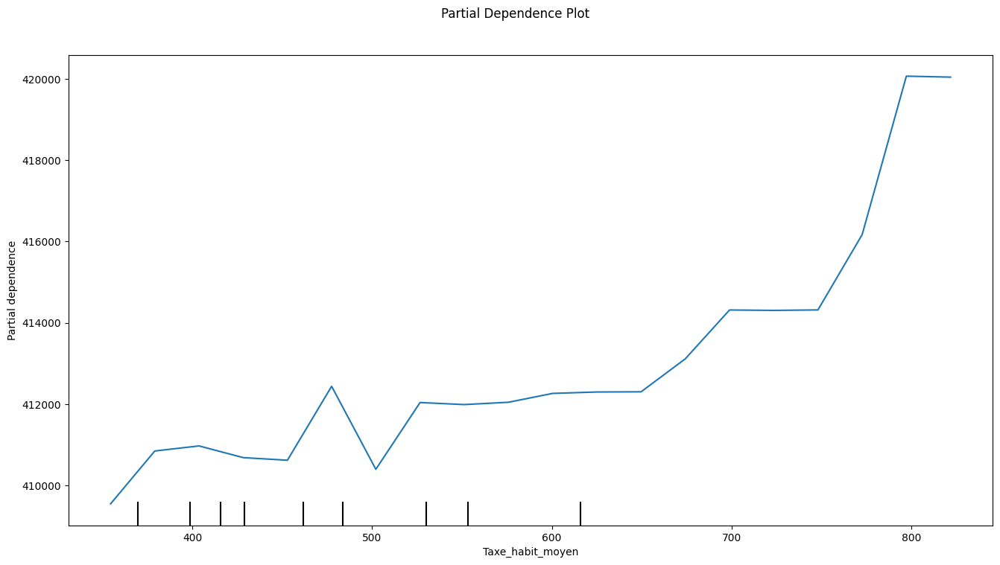

In [ ]:
features = [3]   # l'indice de la taxe d'habitation dans le x_train

# Create the partial dependence plot
fig, ax = plt.subplots(figsize=(16, 8))
PartialDependenceDisplay.from_estimator(
    knn,
    x_train,
    features,
    kind="average",
    n_jobs=-1,
    grid_resolution=20,
    random_state=42,
    ax=ax
)

plt.suptitle("Partial Dependence Plot")
plt.subplots_adjust(top=0.9)
plt.show()

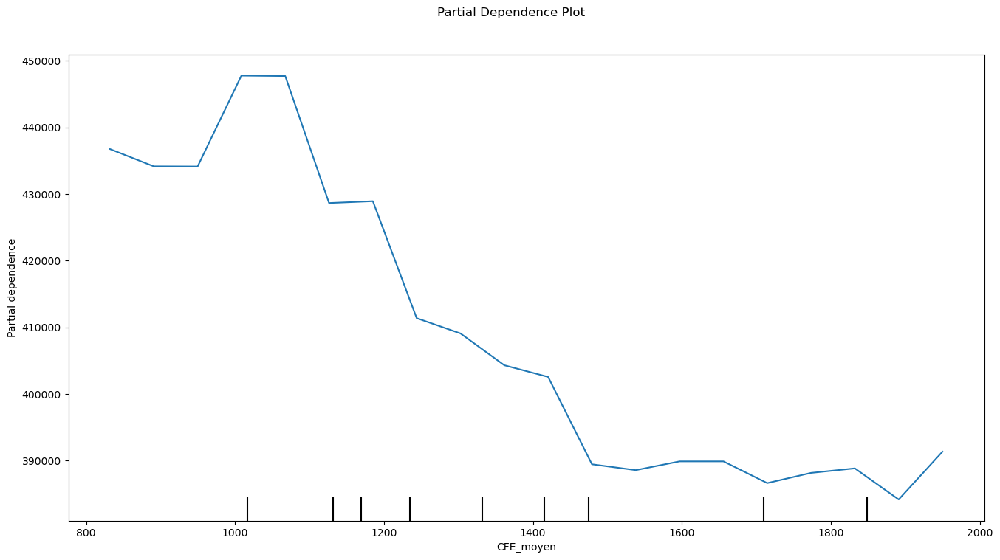

In [74]:
features = [0]   # l'indice de la taxe CFE

# Create the partial dependence plot
fig, ax = plt.subplots(figsize=(16, 8))
PartialDependenceDisplay.from_estimator(
    xgb,
    x_train,
    features,
    kind="average",
    subsample=10000,
    n_jobs=-1,
    grid_resolution=20,
    random_state=42,
    ax=ax
)

plt.suptitle("Partial Dependence Plot")
plt.subplots_adjust(top=0.9)
plt.show()

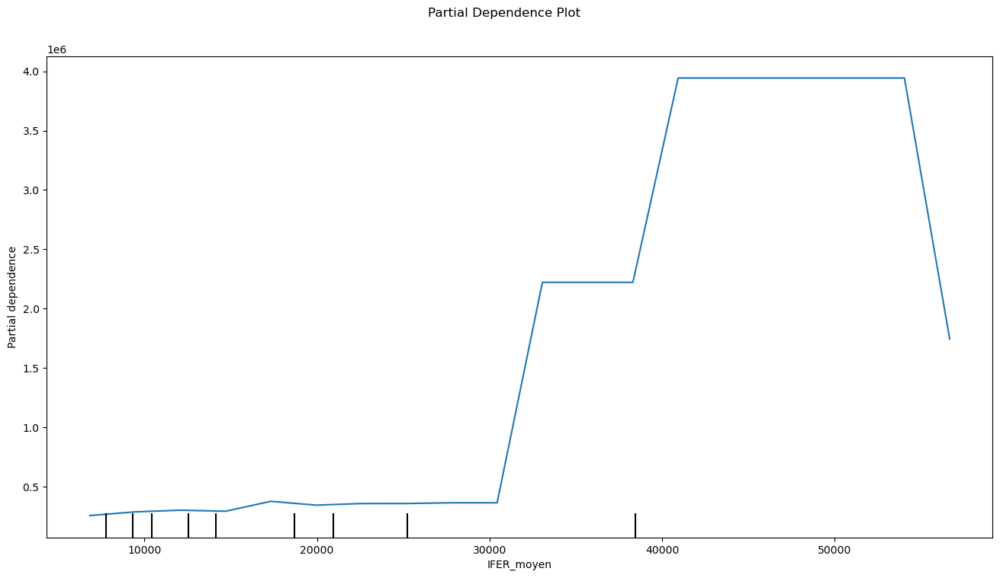

In [72]:
features = [1]   # l'indice de la taxe IFER

# Create the partial dependence plot
fig, ax = plt.subplots(figsize=(16, 8))
PartialDependenceDisplay.from_estimator(
    xgb,
    x_train,
    features,
    kind="average",
    n_jobs=-1,
    grid_resolution=20,
    random_state=42,
    ax=ax
)

plt.suptitle("Partial Dependence Plot")
plt.subplots_adjust(top=0.9)
plt.show()

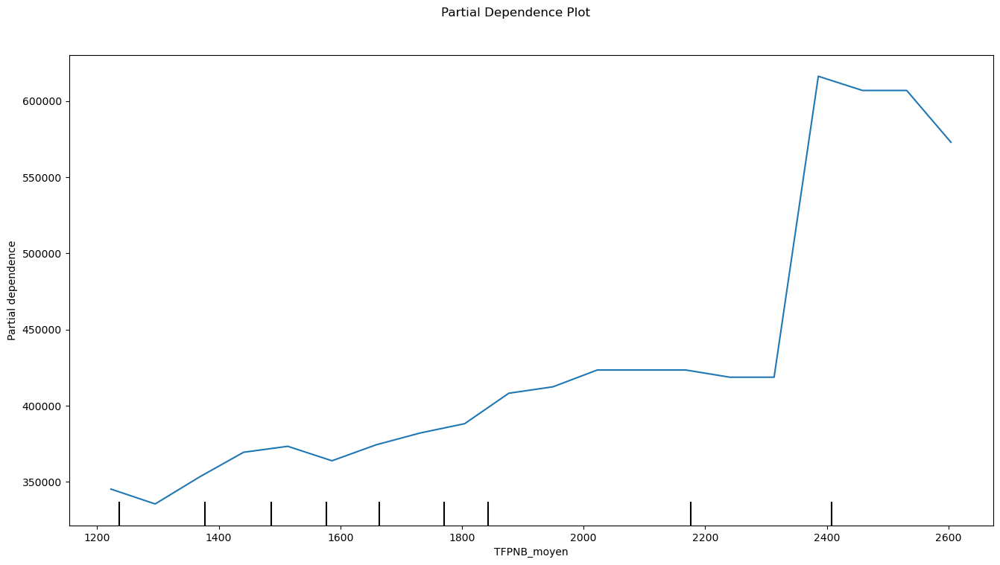

In [70]:
features = [2]   # l'indice de la taxe TFPNB

# Create the partial dependence plot
fig, ax = plt.subplots(figsize=(16, 8))
PartialDependenceDisplay.from_estimator(
    xgb,
    x_train,
    features,
    kind="average",
    n_jobs=-1,
    grid_resolution=20,
    random_state=42,
    ax=ax
)

plt.suptitle("Partial Dependence Plot")
plt.subplots_adjust(top=0.9)
plt.show()

# Interprétation des Partial Dependence Plots (PDP)

## 1. Taxe_habit_moyen
- Ce PDP montre une relation positive entre la variable `Taxe_habit_moyen` et la valeur foncière.
- Au début, l'impact est modéré, mais on observe une augmentation marquée après 600.
- Une `Taxe_habit_moyen` élevée semble fortement corrélée à une augmentation de la valeur foncière, suggérant que les propriétés avec des taxes d'habitation élevées sont généralement de plus grande valeur foncière.

## 2. CFE_moyen
- Le PDP pour `CFE_moyen` présente une tendance inverse à celle de `Taxe_habit_moyen`.
- En effet, lorsque `CFE_moyen` augmente, la valeur foncière diminue graduellement, surtout après 1400.
- Cela pourrait indiquer que les propriétés avec un CFE moyen plus élevé sont potentiellement dans des zones avec des valeurs foncières plus faibles ou que le CFE influence négativement la perception de valeur de la propriété.

## 3. IFER_moyen
- Le PDP de `IFER_moyen` montre un saut abrupt dans la valeur foncière à environ 30 000.
- Cette variation suggère une possible relation non linéaire où les valeurs d'IFER plus faibles n'ont que peu d'effet, mais une augmentation au-delà de 30 000 est associée à des propriétés de très haute valeur foncière.
- Cela peut être lié à des zones ou types de propriétés spécifiques où l'IFER est significatif.

## 4. TFPNB_moyen
- La `TFPNB_moyen` présente un effet relativement constant jusqu'à environ 2200, au-delà duquel la valeur foncière augmente fortement.
- Cela pourrait indiquer que des taxes TFPNB élevées sont caractéristiques de propriétés de valeur plus élevée, possiblement en raison de leur taille ou de leur emplacement.
- Comme pour `Taxe_habit_moyen`, il semble que TFPNB ait un impact positif sur la valeur foncière au-delà d'un certain seuil.

---

# Importance des variables

In [52]:
from sklearn.inspection import permutation_importance

C:\Users\kaffa\AppData\Local\Temp\ipykernel_15624\2553913433.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=perm_feature_importances_sorted, palette='viridis')


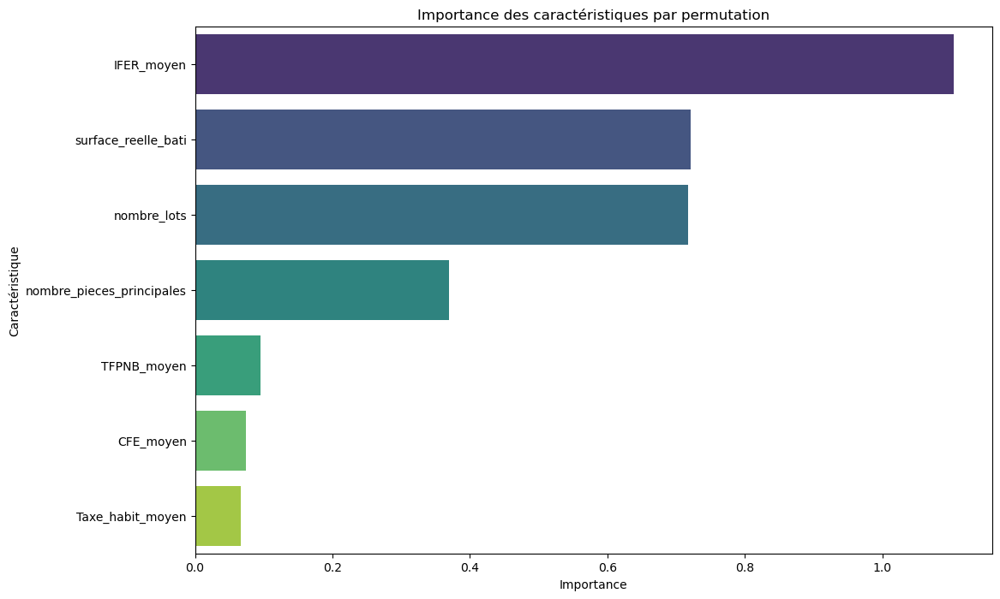

In [60]:
# Calculer l'importance des caractéristiques par permutation
perm_importance = permutation_importance(knn, x_test, y_test, random_state=123)
#n_repeats=1000

feature_names = x.columns
perm_feature_importances = pd.DataFrame({
    'Feature': feature_names,
    'Importance': perm_importance.importances_mean,
    'Importance_std': perm_importance.importances_std
})

# Trier par ordre décroissant
perm_feature_importances_sorted = perm_feature_importances.sort_values(by='Importance', ascending=False)

# graphique
plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=perm_feature_importances_sorted, palette='viridis')
plt.title('Importance des caractéristiques par permutation')
plt.xlabel('Importance')
plt.ylabel('Caractéristique')
plt.show()

## Top 3 des Variables les Plus Importantes
1. **IFER_moyen** : C'est la variable la plus influente dans la prédiction de la valeur foncière, ce qui signifie que cette taxe a un fort impact sur l'évaluation des propriétés.
2. **surface_reelle_bati** : La surface bâtie est un facteur clé, ce qui est intuitif puisqu'une plus grande surface augmente souvent la valeur de la propriété.
3. **nombre_lots** : Le nombre de lots impacte également la valeur.

## Comment fonctionne l'importance par permutation
L'importance par permutation mesure l'impact de chaque variable en permutant ses valeurs et en observant la diminution de la performance du modèle. Plus la performance diminue lorsque les valeurs sont mélangées, plus la variable est jugée importante pour le modèle.


# Shap values

In [62]:
import shap

In [66]:
explainer = shap.TreeExplainer(xgb)

# Calculer les SHAP values
shap_values = explainer.shap_values(x_test)

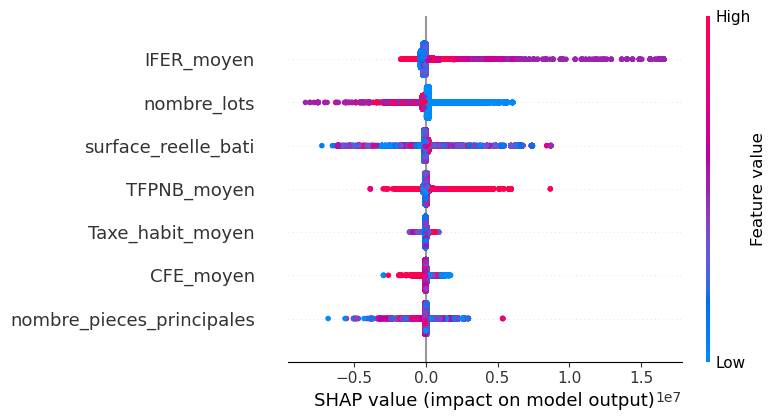

In [68]:
shap.initjs()

#summary_plot
shap.summary_plot(shap_values, x_test)

# Interprétation des SHAP Values

- **IFER_moyen** : Cette variable a le plus grand impact sur le modèle. Des valeurs élevées d'IFER_moyen tendent à augmenter la prédiction de la valeur foncière.
- **nombre_lots** et **surface_reelle_bati** : Ces variables ont également un impact important. Un nombre élevé de lots et une plus grande surface augmentent la valeur prédite.
- **TFPNB_moyen** : Cette taxe a un effet modéré, influençant la valeur foncière dans les deux directions selon les autres caractéristiques.
- **Taxe_habit_moyen** et **CFE_moyen** : Elles ont un impact moindre, bien que certaines valeurs élevées puissent influencer la prédiction.
- **nombre_pieces_principales** : Cette variable a un effet relativement faible par rapport aux autres.

# Conclusion

En intégrant les résultats des PDP, SHAP values et Permutation Importance :
- **IFER_moyen** est la variable la plus déterminante pour prédire la valeur foncière, suivie par les caractéristiques structurelles comme **surface_reelle_bati** et **nombre_lots**.
- Les taxes comme **TFPNB_moyen** et **Taxe_habit_moyen** jouent un rôle secondaire mais peuvent encore influer sur les valeurs foncières dans certains contextes.
- **Les valeurs SHAP** montrent comment chaque observation individuelle est influencée par chaque caractéristique, et les PDP montrent des tendances globales cohérentes avec l'importance par permutation.

En résumé, les caractéristiques structurelles et certaines taxes spécifiques ont une influence majeure sur la prédiction, tandis que d'autres taxes jouent un rôle moins important.
